In [ ]:
import kagglehub
import os
import cv2
import pickle
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import MiniBatchKMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from pathlib import Path
from skimage.feature import hog, local_binary_pattern


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'animals10' dataset.
Path to dataset files: /kaggle/input/animals10


In [ ]:
raw_img_path = os.path.join(path, 'raw-img')

raw_img_contents = os.listdir(raw_img_path)
print(f"Contents of the '{raw_img_path}' directory:")
print(raw_img_contents)

Contents of the '/kaggle/input/animals10/raw-img' directory:
['cavallo', 'pecora', 'elefante', 'gatto', 'scoiattolo', 'gallina', 'ragno', 'mucca', 'cane', 'farfalla']


In [ ]:
translation_table = { "cane": "dog",
                      "cavallo": "horse",
                      "elefante": "elephant",
                      "farfalla": "butterfly",
                      "gallina": "chicken",
                      "gatto": "cat",
                      "mucca": "cow",
                      "pecora": "sheep",
                      "scoiattolo": "squirrel",
                      "ragno": "spider"
                      }

In [ ]:
def load_dataset(dataset_path, translation_table):
  image_paths = []
  labels = []

  for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    if os.path.isdir(label_path):
      for image_file in tqdm(os.listdir(label_path), desc=f'Loading {translation_table[label]}: '):
        image_path = os.path.join(label_path, image_file)
        if os.path.isfile(image_path):
          image_paths.append(image_path)
          labels.append(translation_table[label])

  df = pd.DataFrame({'image_path': image_paths, 'label': labels})
  return df

In [ ]:
data = load_dataset(raw_img_path, translation_table)
data.head()

Loading butterfly: 100%|██████████| 2112/2112 [00:02<00:00, 801.07it/s]


,image_path,label
0,/kaggle/input/animals10/raw-img/cavallo/OIP-md...,horse
1,/kaggle/input/animals10/raw-img/cavallo/OIP-TP...,horse
2,/kaggle/input/animals10/raw-img/cavallo/OIP-jl...,horse
3,/kaggle/input/animals10/raw-img/cavallo/OIP-F4...,horse
4,/kaggle/input/animals10/raw-img/cavallo/OIP-UF...,horse


In [ ]:
encoder = LabelEncoder()
data['label_encoded'] = encoder.fit_transform(data['label'])
data.head()

,image_path,label,label_encoded
0,/kaggle/input/animals10/raw-img/cavallo/OIP-md...,horse,6
1,/kaggle/input/animals10/raw-img/cavallo/OIP-TP...,horse,6
2,/kaggle/input/animals10/raw-img/cavallo/OIP-jl...,horse,6
3,/kaggle/input/animals10/raw-img/cavallo/OIP-F4...,horse,6
4,/kaggle/input/animals10/raw-img/cavallo/OIP-UF...,horse,6


In [ ]:
train_paths, test_paths, train_labels, test_labels = train_test_split(data['image_path'], data['label_encoded'], test_size=0.2, random_state=42, stratify=data['label_encoded'])

In [ ]:
def get_sift_descriptors(image_path, nfeatures=None):
  img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
  if img is None:
    return None
  limit = nfeatures if nfeatures is not None else 0
  sift = cv2.SIFT_create(nfeatures=limit)
  _, des = sift.detectAndCompute(img, None)
  return des

def build_vocabulary_incremental(image_paths, k=100, batch_size=100, nfeatures=None):
  kmeans = MiniBatchKMeans(n_clusters=k, random_state=42, batch_size=1000, n_init='auto')
  batch_descriptors = []

  print(f"Building vocabulary incrementally (Batch size: {batch_size} images)...")

  for i, path in enumerate(tqdm(image_paths, desc="Training K-Means")):
    des = get_sift_descriptors(path, nfeatures)

    if des is not None and len(des) > 0:
      batch_descriptors.append(des)

    if len(batch_descriptors) >= batch_size:
      X_batch = np.vstack(batch_descriptors).astype(np.float32)

      if X_batch.shape[0] >= k:
        kmeans.partial_fit(X_batch)

      batch_descriptors = []
      del X_batch

  if batch_descriptors:
    X_batch = np.vstack(batch_descriptors).astype(np.float32)
    if X_batch.shape[0] >= k:
      kmeans.partial_fit(X_batch)

  return kmeans

def extract_features_bovw(image_paths, kmeans_model, nfeatures=None):
  k = kmeans_model.n_clusters
  features = []

  for path in tqdm(image_paths, desc='Extracting Histograms'):
    des = get_sift_descriptors(path, nfeatures)
    hist = np.zeros(k, dtype=np.float32)

    if des is not None and len(des) > 0:
      predictions = kmeans_model.predict(des)
      np.add.at(hist, predictions, 1)
      cv2.normalize(hist, hist, norm_type=cv2.NORM_L2)

    features.append(hist)

  return np.array(features)


In [ ]:
sift_train_filename = '/content/drive/MyDrive/CS231/sift_train_features.pkl'
sift_test_filename = '/content/drive/MyDrive/CS231/sift_test_features.pkl'
kmeans_model_filename = '/content/drive/MyDrive/CS231/kmeans_model.pkl'

if not os.path.exists(kmeans_model_filename):
  kmeans_model = build_vocabulary_incremental(train_paths, k=100, nfeatures=None)
  with open(kmeans_model_filename, 'wb') as f:
    pickle.dump(kmeans_model, f)
  print(f"K-Means model saved to '{kmeans_model_filename}'")

else:
  kmeans_model = pickle.load(open(kmeans_model_filename, 'rb'))

In [ ]:
if not os.path.exists(sift_train_filename):
  X_train = extract_features_bovw(train_paths, kmeans_model, nfeatures=None)
  X_test = extract_features_bovw(test_paths, kmeans_model, nfeatures=None)

  with open(sift_train_filename, 'wb') as f:
    pickle.dump(X_train, f)

  with open(sift_test_filename, 'wb') as f:
    pickle.dump(X_test, f)

  print(f"SIFT train features saved to '{sift_train_filename}'")
  print(f"SIFT test features saved to '{sift_test_filename}'")

else:
  X_train = pickle.load(open(sift_train_filename, 'rb'))
  X_test = pickle.load(open(sift_test_filename, 'rb'))


In [ ]:
y_train, y_test = train_labels, test_labels
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("\nData scaled successfully.")
print(f"Scaled X_train shape: {X_train_scaled.shape}")
print(f"Scaled X_test shape: {X_test_scaled.shape}")

X_train shape: (20943, 100)
X_test shape: (5236, 100)

Data scaled successfully.
Scaled X_train shape: (20943, 100)
Scaled X_test shape: (5236, 100)


In [ ]:
scaler_filename = '/content/drive/MyDrive/CS231/sift_scaler.pkl'

with open(scaler_filename, 'wb') as f:
  pickle.dump(scaler, f)

print(f"Scaler saved to '{scaler_filename}'")

Scaler saved to '/content/drive/MyDrive/CS231/sift_scaler.pkl'


SVM


In [ ]:
param_grid = [
    {'C': [0.1, 1, 10], 'gamma': [0.01, 0.1], 'kernel': ['rbf'], 'class_weight': ['balanced']},
    {'C': [0.1, 1, 10], 'kernel': ['linear'], 'class_weight': ['balanced']}
]

svc = SVC(random_state=42)
grid_search = GridSearchCV(svc, param_grid, cv=2, verbose=2, n_jobs=-1)

print("Starting GridSearchCV to find optimal SVC hyperparameters...")
grid_search.fit(X_train_scaled, y_train)

print("GridSearchCV completed.")

Starting GridSearchCV to find optimal SVC hyperparameters...
Fitting 2 folds for each of 9 candidates, totalling 18 fits
GridSearchCV completed.


Best parameters: {'C': 10, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'rbf'}
Accuracy Score: 0.4746

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.53      0.60      0.56       422
         cat       0.44      0.40      0.42       334
     chicken       0.42      0.44      0.43       620
         cow       0.33      0.33      0.33       373
         dog       0.44      0.52      0.48       973
    elephant       0.38      0.30      0.34       289
       horse       0.43      0.43      0.43       525
       sheep       0.42      0.30      0.35       364
      spider       0.66      0.69      0.67       964
    squirrel       0.40      0.31      0.35       372

    accuracy                           0.47      5236
   macro avg       0.45      0.43      0.44      5236
weighted avg       0.47      0.47      0.47      5236


Confusion Matrix:


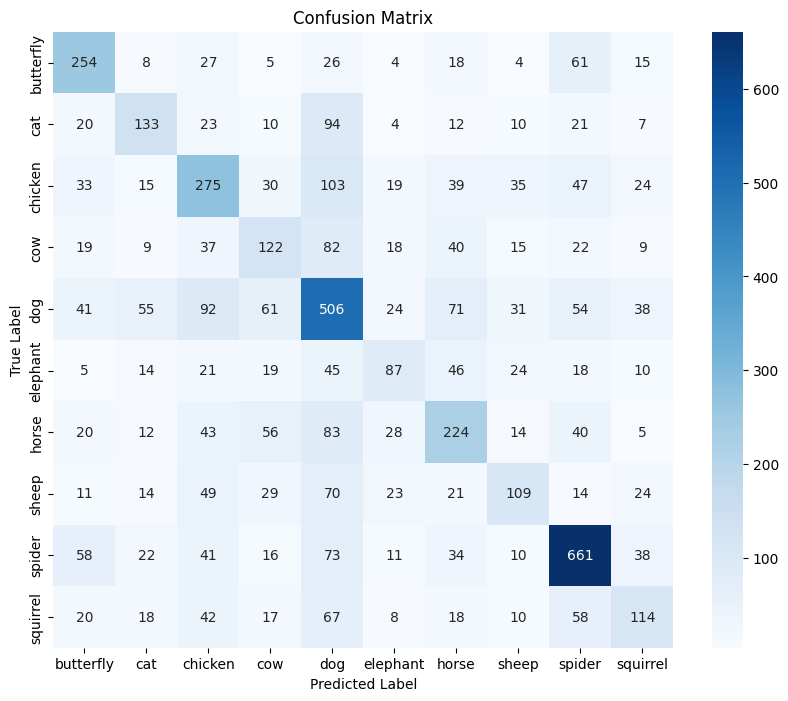

In [ ]:
y_pred = grid_search.best_estimator_.predict(X_test_scaled)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Accuracy Score: {accuracy_score(y_test, y_pred):.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))

print("\nConfusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Save the best SVC model
best_svc_model = grid_search.best_estimator_
model_filename = '/content/drive/MyDrive/CS231/sift_model.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(best_svc_model, file)
print(f"Best SVC model saved to '{model_filename}'")

# Save the LabelEncoder object
encoder_filename = '/content/drive/MyDrive/CS231/sift_label_encoder.pkl'
with open(encoder_filename, 'wb') as file:
    pickle.dump(encoder, file)
print(f"LabelEncoder object saved to '{encoder_filename}'")

Best SVC model saved to '/content/drive/MyDrive/CS231/sift_model.pkl'
LabelEncoder object saved to '/content/drive/MyDrive/CS231/sift_label_encoder.pkl'


Running predictions on 5 random images from the test set...


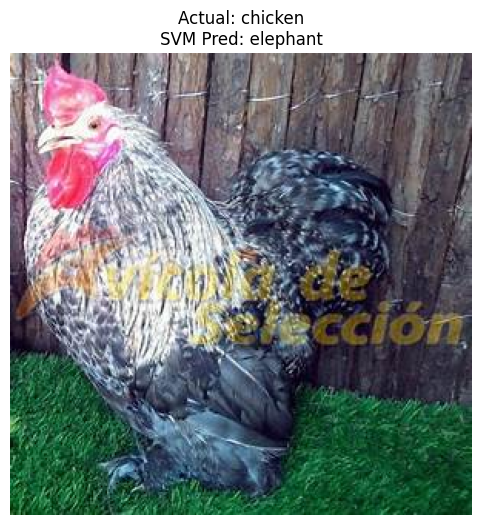

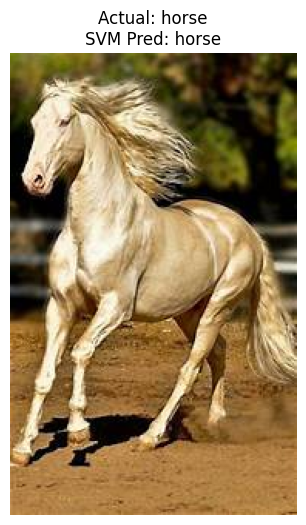

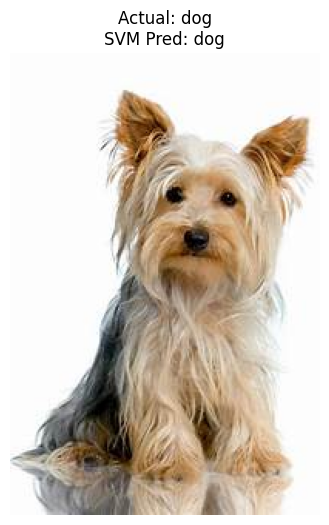

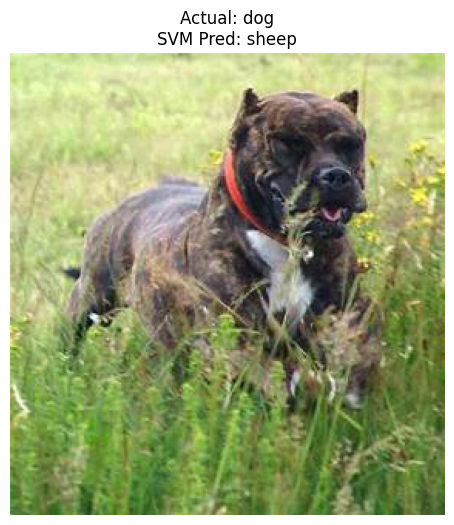

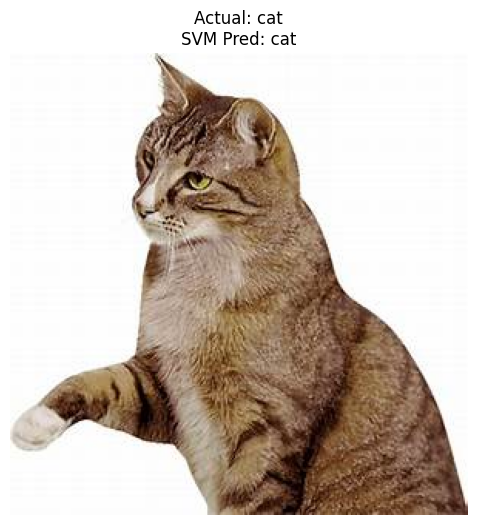

In [ ]:
num_examples = 5
random_indices = random.sample(range(len(test_paths)), num_examples)

print(f"Running predictions on {num_examples} random images from the test set...")

for i, idx in enumerate(random_indices):
    image_path = test_paths.iloc[idx]
    true_label_encoded = test_labels.iloc[idx]
    true_label = encoder.inverse_transform([true_label_encoded])[0]

    # 1. Extract SIFT descriptors
    des = get_sift_descriptors(image_path, nfeatures=None)

    if des is not None and len(des) > 0:
        # 2. Build BoVW histogram
        hist = np.zeros(kmeans_model.n_clusters, dtype=np.float32)
        predictions = kmeans_model.predict(des)
        np.add.at(hist, predictions, 1)
        cv2.normalize(hist, hist, norm_type=cv2.NORM_L2)

        # Reshape for scaler (expects 2D array)
        bovw_feature = hist.reshape(1, -1)

        # 3. Scale the features
        scaled_feature = scaler.transform(bovw_feature)

        # 4. Predict the label
        predicted_label_encoded = best_svc_model.predict(scaled_feature)[0]
        predicted_label = encoder.inverse_transform([predicted_label_encoded])[0]

        # 5. Display the image and prediction
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.title(f"Actual: {true_label}\nSVM Pred: {predicted_label}")
        plt.axis('off')
        plt.show()

    else:
        print(f"Could not extract SIFT features for image: {image_path}. Skipping.")

Random Forest


In [ ]:
random_forest_model_filename = '/content/drive/MyDrive/CS231/sift_random_forest_model.pkl'

param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'class_weight': ['balanced']
}

rf_clf = RandomForestClassifier(random_state=42)
grid_search_rf = GridSearchCV(rf_clf, param_grid_rf, cv=2, verbose=2, n_jobs=-1)

print("Starting GridSearchCV to find optimal Random Forest hyperparameters...")
grid_search_rf.fit(X_train_scaled, y_train)

print("GridSearchCV completed.")

Starting GridSearchCV to find optimal Random Forest hyperparameters...
Fitting 2 folds for each of 9 candidates, totalling 18 fits
GridSearchCV completed.


Best parameters: {'class_weight': 'balanced', 'max_depth': 20, 'n_estimators': 300}
Accuracy Score: 0.4206

Classification Report:
              precision    recall  f1-score   support

   butterfly       0.71      0.33      0.45       422
         cat       0.67      0.20      0.30       334
     chicken       0.37      0.46      0.41       620
         cow       0.44      0.05      0.10       373
         dog       0.34      0.70      0.46       973
    elephant       0.43      0.08      0.13       289
       horse       0.38      0.41      0.39       525
       sheep       0.41      0.18      0.25       364
      spider       0.53      0.72      0.61       964
    squirrel       0.36      0.04      0.07       372

    accuracy                           0.42      5236
   macro avg       0.46      0.32      0.32      5236
weighted avg       0.45      0.42      0.38      5236


Confusion Matrix:


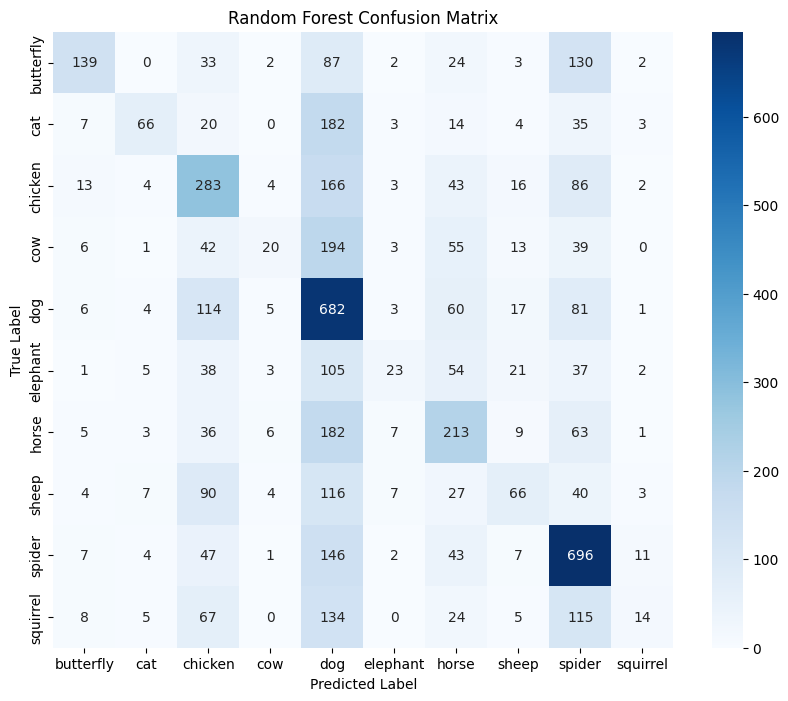

In [ ]:
y_pred_rf = grid_search_rf.best_estimator_.predict(X_test_scaled)

print(f"Best parameters: {grid_search_rf.best_params_}")
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_rf):.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf, target_names=encoder.classes_))

print("\nConfusion Matrix:")
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(10, 8))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Random Forest Confusion Matrix')
plt.show()

In [ ]:
best_rf_model = grid_search_rf.best_estimator_
model_filename = '/content/drive/MyDrive/CS231/sift_random_forest_model.pkl'
with open(random_forest_model_filename, 'wb') as file:
    pickle.dump(best_rf_model, file)
print(f"Best Random Forest model saved to '{model_filename}'")

Best Random Forest model saved to '/content/drive/MyDrive/CS231/sift_random_forest_model.pkl'


Running predictions on 10 random images from the test set...


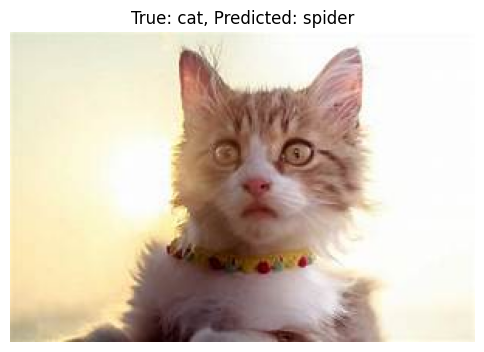

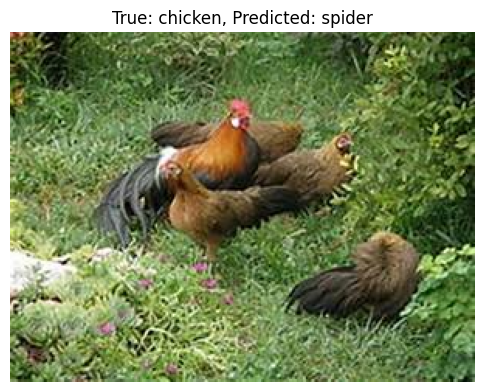

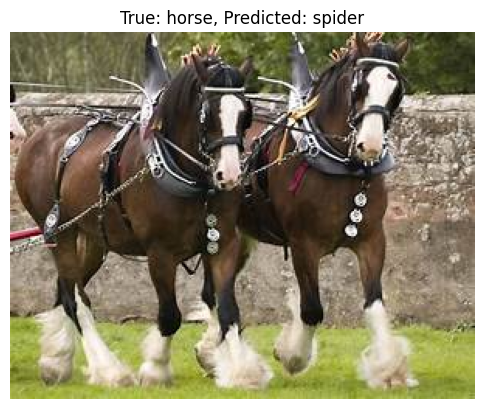

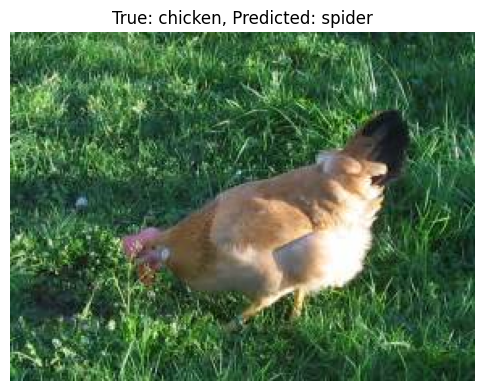

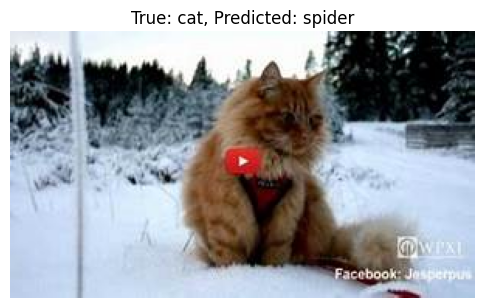

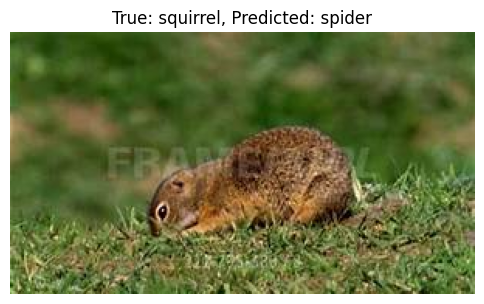

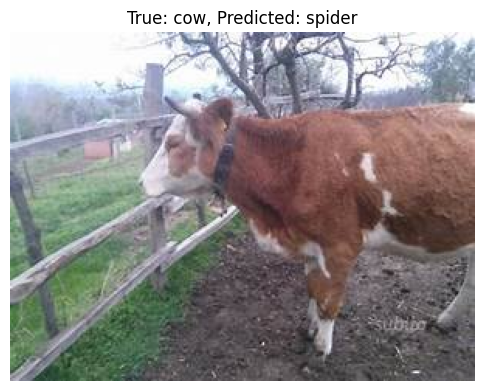

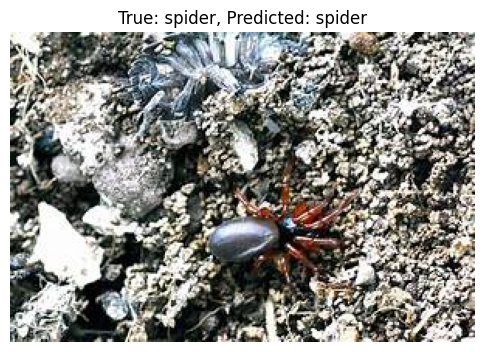

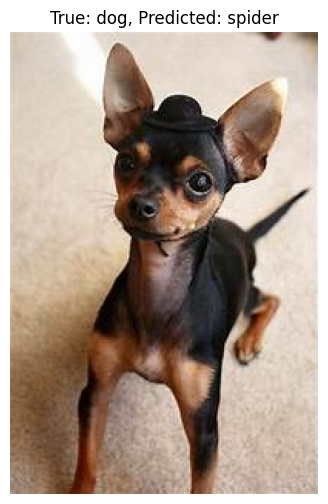

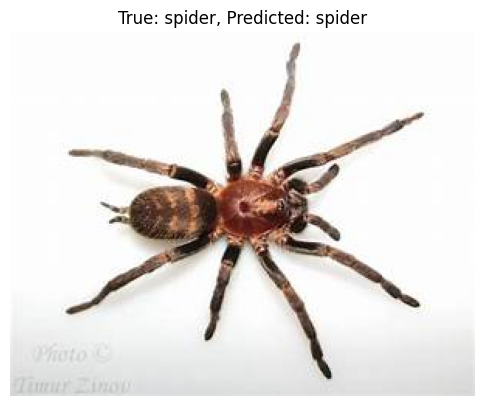

In [ ]:
num_examples = 10
random_indices = random.sample(range(len(test_paths)), num_examples)

print(f"Running predictions on {num_examples} random images from the test set...")

for i, idx in enumerate(random_indices):
    image_path = test_paths.iloc[idx]
    true_label_encoded = test_labels.iloc[idx]
    true_label = encoder.inverse_transform([true_label_encoded])[0]

    if des is not None and len(des) > 0:
      hist = np.zeros(kmeans_model.n_clusters, dtype=np.float32)
      predictions = kmeans_model.predict(des)
      np.add.at(hist, predictions, 1)
      cv2.normalize(hist, hist, norm_type=cv2.NORM_L2)

      bovw_feature = hist.reshape(1, -1)

      scaled_feature = scaler.transform(bovw_feature)

      predicted_label_encoded = best_rf_model.predict(scaled_feature)[0]
      predicted_label = encoder.inverse_transform([predicted_label_encoded])[0]

      img = cv2.imread(image_path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

      plt.figure(figsize=(6, 6))
      plt.imshow(img)
      plt.title(f"True: {true_label}, Predicted: {predicted_label}")
      plt.axis('off')
      plt.show()

    else:
      print(f"Could not extract SIFT features for image: {image_path}. Skipping.")

Running predictions on 20 random images from the test set...


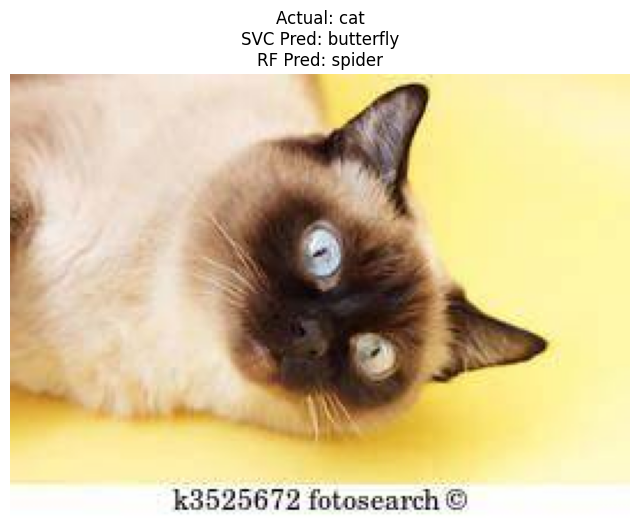

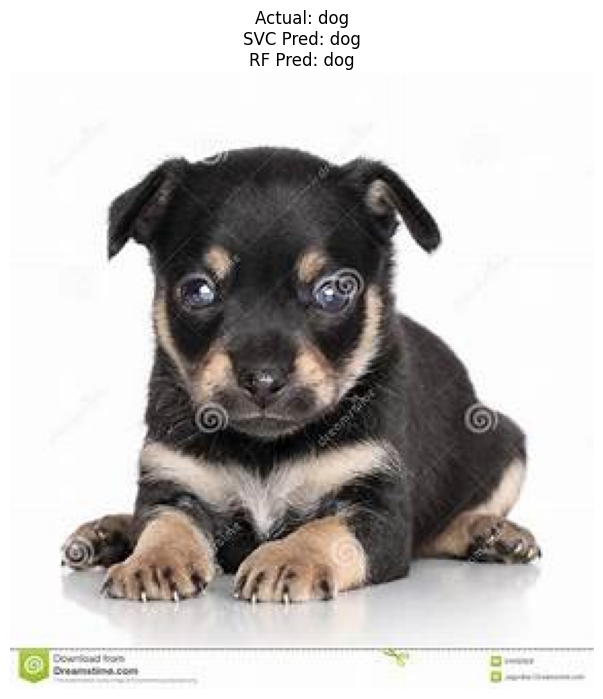

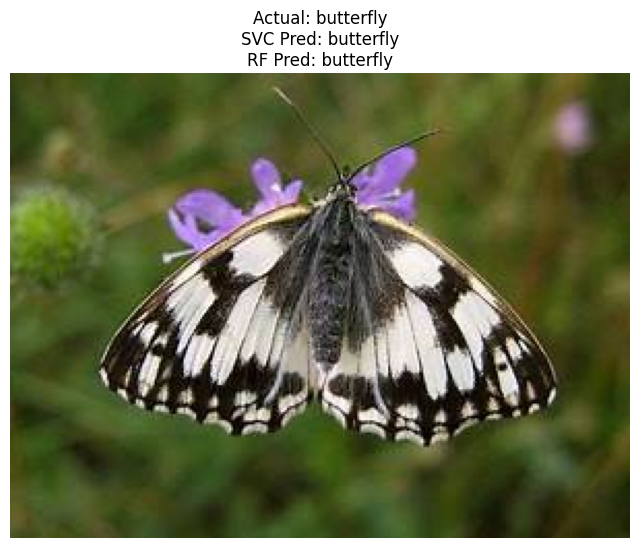

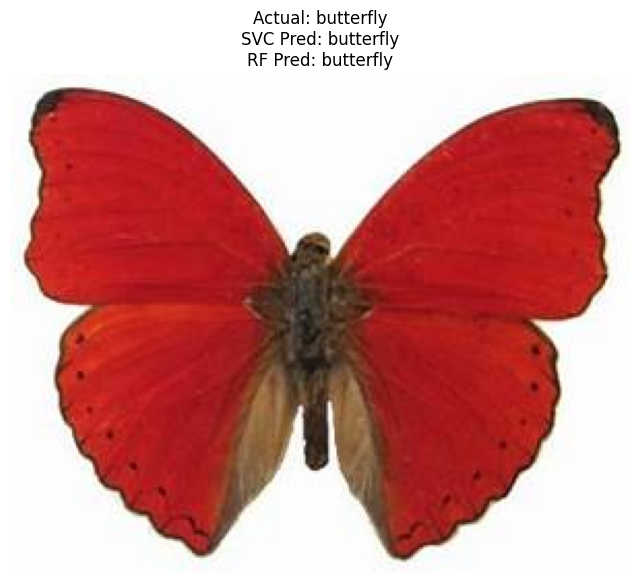

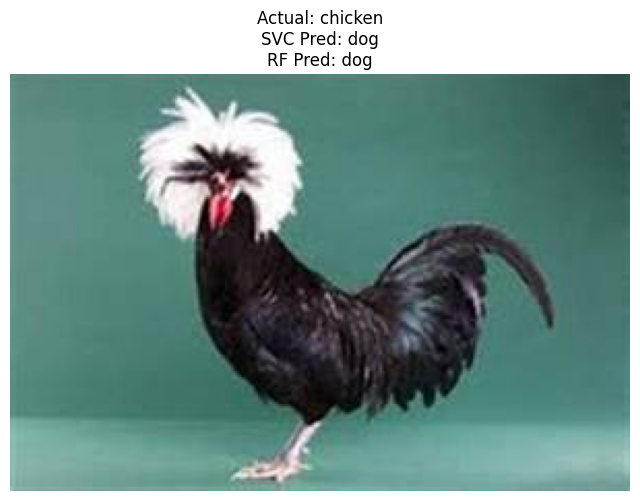

...

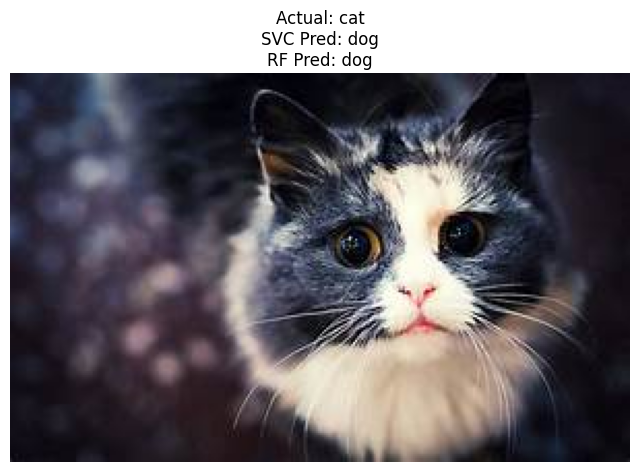

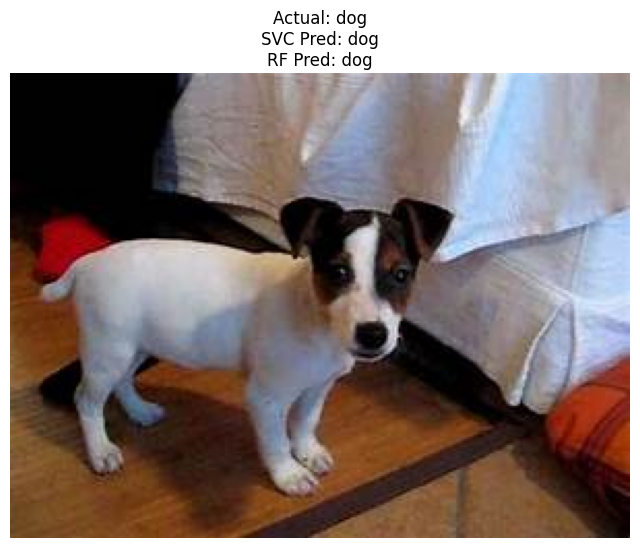

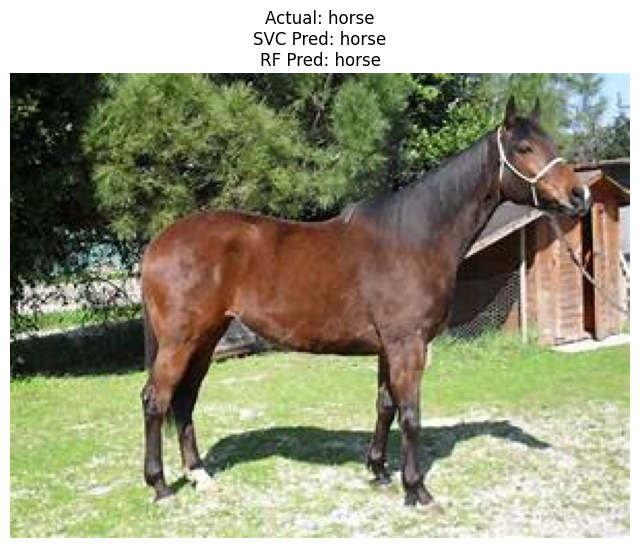

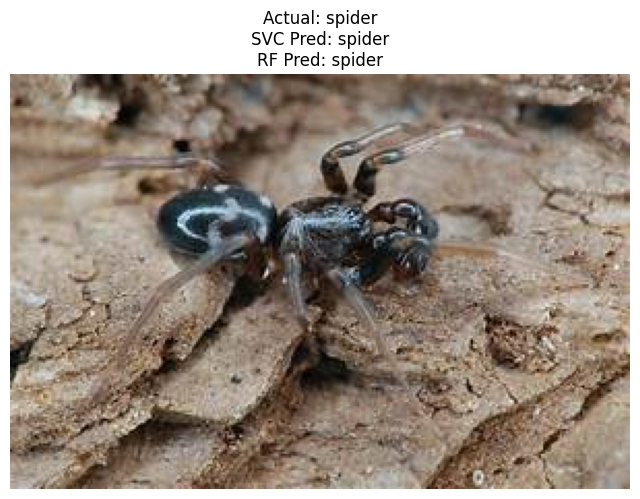

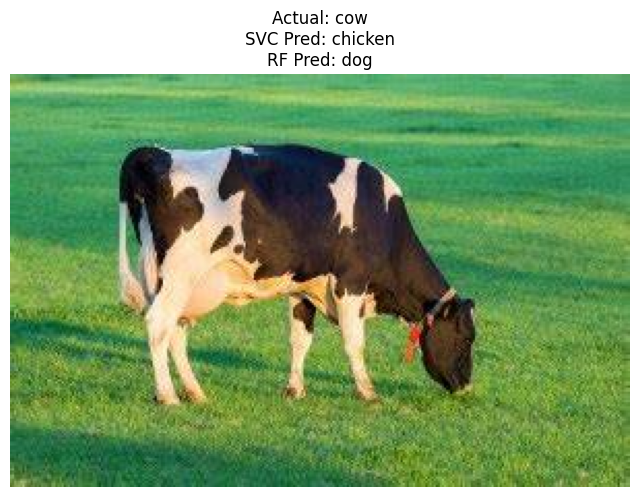

In [35]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
# Giả định: các hàm/biến sau đã được định nghĩa hoặc tải:
# - get_sift_descriptors (hàm trích xuất SIFT)
# - test_paths (Series/DataFrame của đường dẫn ảnh kiểm tra)
# - test_labels (Series/DataFrame của nhãn đã mã hóa)
# - encoder (đối tượng LabelEncoder đã tải/fit)
# - kmeans_model (MiniBatchKMeans đã fit)
# - scaler (StandardScaler đã fit)
# - best_svc_model (mô hình SVC đã fit)
# - best_rf_model (mô hình RandomForestClassifier đã fit)

num_examples = 20
random_indices = random.sample(range(len(test_paths)), num_examples)

print(f"Running predictions on {num_examples} random images from the test set...")

for i, idx in enumerate(random_indices):
    image_path = test_paths.iloc[idx]
    true_label_encoded = test_labels.iloc[idx]
    true_label = encoder.inverse_transform([true_label_encoded])[0]

    # --- TIỀN XỬ LÝ (GIỐNG NHAU CHO CẢ HAI MÔ HÌNH) ---

    # 1. Extract SIFT descriptors
    des = get_sift_descriptors(image_path, nfeatures=None)

    if des is not None and len(des) > 0:
        # 2. Build BoVW histogram
        hist = np.zeros(kmeans_model.n_clusters, dtype=np.float32)
        predictions = kmeans_model.predict(des)
        np.add.at(hist, predictions, 1)
        cv2.normalize(hist, hist, norm_type=cv2.NORM_L2)

        # Reshape for scaler (expects 2D array)
        bovw_feature = hist.reshape(1, -1)

        # 3. Scale the features
        scaled_feature = scaler.transform(bovw_feature)

        # --- DỰ ĐOÁN (CHO TỪNG MÔ HÌNH) ---

        # 4a. Predict with SVC
        predicted_svc_encoded = best_svc_model.predict(scaled_feature)[0]
        predicted_svc_label = encoder.inverse_transform([predicted_svc_encoded])[0]

        # 4b. Predict with Random Forest
        predicted_rf_encoded = best_rf_model.predict(scaled_feature)[0]
        predicted_rf_label = encoder.inverse_transform([predicted_rf_encoded])[0]

        # 5. Display the image and prediction
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        # Cập nhật tiêu đề để hiển thị cả hai kết quả
        plt.title(f"Actual: {true_label}\nSVC Pred: {predicted_svc_label}\nRF Pred: {predicted_rf_label}")
        plt.axis('off')
        plt.show()

    else:
        print(f"Could not extract SIFT features for image: {image_path}. Skipping.")